Setup Dependencies

# 🐶 End-to-end Multi-class Dog Breed Classification

This notebook builds and end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog givrn an image of a dog.

When I'm sitting at the cafr and I take a photo of a dog, I want to know waht breed of dog it is.

## Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

the Evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructures data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have no labels, because we'll want to predict them).

In [ ]:
!pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!mkdir ~/.kaggle

In [ ]:
!cp /content/drive/MyDrive/kaggle/kaggle.json ~/.kaggle/kaggle.json

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

Import data from Kaggle

In [ ]:
! kaggle competitions download dog-breed-identification

In [ ]:
! unzip dog-breed-identification -d /content/drive/MyDrive/DogVision

Get our workspace ready

In [1]:
# Import TensorFlow into Colab
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.9.2


### Get  our workspace ready

* Import TensorFlow
* Import TensorFlow Hub
* Make sure we're using a GPU

In [2]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF bersion:", tf.__version__)
print("TF Hub bersion:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YES!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF bersion: 2.9.2
TF Hub bersion: 0.12.0
GPU available (YES!!!)


### Getting our data ready (tuning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Tuning our images into Tensors (numerical repesentations).

Let's start by accessing our data and cheking our labels

In [3]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/DogVision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


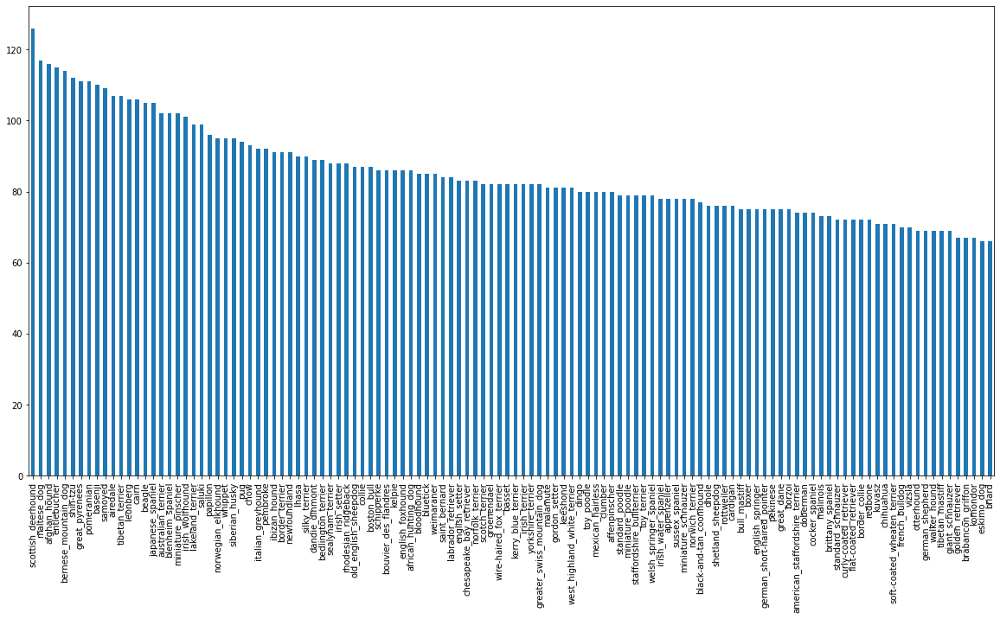

In [5]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [6]:
labels_csv["breed"].value_counts().median()

82.0

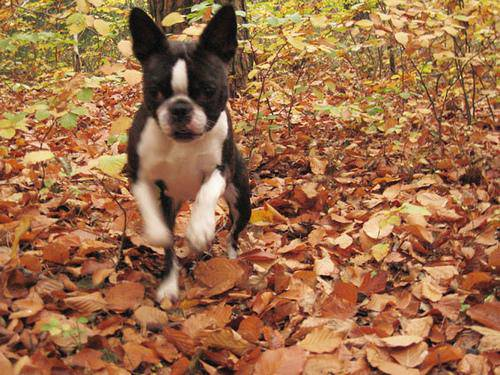

In [7]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels

Let's get a list of alll our images file pathname

In [8]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [9]:
# Create pathnames form images ID's
filenames = ["drive/MyDrive/DogVision/train/" + fname +".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
# Check whether number of filenames mathces number of actual imag files
import os
if len(os.listdir("drive/MyDrive/DogVision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do no match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


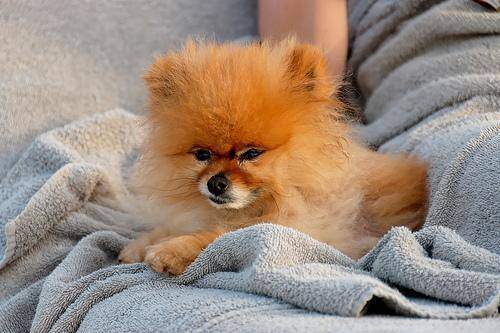

In [11]:
# One more check
Image(filenames[8000])

In [12]:
labels_csv["breed"][8000]

'pomeranian'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [13]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
len(labels)

10222

In [15]:
# See if number of labels mathces the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labes does not mathce number of filenames, check data directory!")

Number of labels matches number of filenames!


In [16]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [17]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [18]:
# Tunrn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [19]:
len(boolean_labels)

10222

In [20]:
# Examples: Tuning boolean array integers
print(labels[0])
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # thre willl be a 1 where the sample label occurs 

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [21]:
print(labels[2])
print(np.where(unique_breeds == labels[2])) # index where label occurs
print(boolean_labels[2].argmax()) # index where label occurs in boolean array
print(boolean_labels[2].astype(int)) # thre willl be a 1 where the sample label occurs 

pekinese
(array([85]),)
85
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [22]:
filenames[:10]

['drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creaing our own validation set

Since the dataset from kaggle doesn't come with a validation set, we're going to create our own.

In [23]:
# Setup X & y varaibles
X = filenames
y = boolean_labels

In [24]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increse as needed.

In [25]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [26]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                    test_size=0.2,
                                                    random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [27]:
# Let's have a geez at the training data
X_train[:5], y_train[:5]

(['drive/MyDrive/DogVision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/DogVision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/DogVision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/DogVision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/DogVision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False

## Preprocesing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function wich does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` (a jgp) into Tensors
4. Resize the `image` to be shape of (224,224)
5. Return the modified `image`

Before we do, let's see what importing an image looks like.

In [28]:
# Convert image to NumOy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [29]:
image.max(), image.min()

(255, 0)

In [30]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [31]:
# Turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable image
3. Turn our image (a jgp) into Tensors
4. Normalize our image (covnvert color channel values from 0-255 to 0-1)
5. Resize the image to be shape of (224, 224)
6. Return the modified image

In [32]:
# Define image size
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  
  return image

In [ ]:
# tensor = tf.io.read_file(filenames[26])
# tensor

In [ ]:
# tensor = tf.image.decode_jpeg(tensor, channels=3)[:2]

In [ ]:
# tf.image.convert_image_dtype(tensor, tf.float32)

## Tuning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... They all might not fit into memory.

So that's whay we do about 32 (hthis is the batch size) images at a time (you can manually adjust the batch size if need be).

In irder ti use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: `(image, label)`.

In [33]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and returns a typle of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [34]:
# demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data(`x` & `y`) into batches!

In [35]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
    
  return data_batch

In [36]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [37]:
# Check out the different attribbutes od our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now inbatches, however, these can be a little hard to understand/comprehend, let's visualize them!!

In [38]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

In [39]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

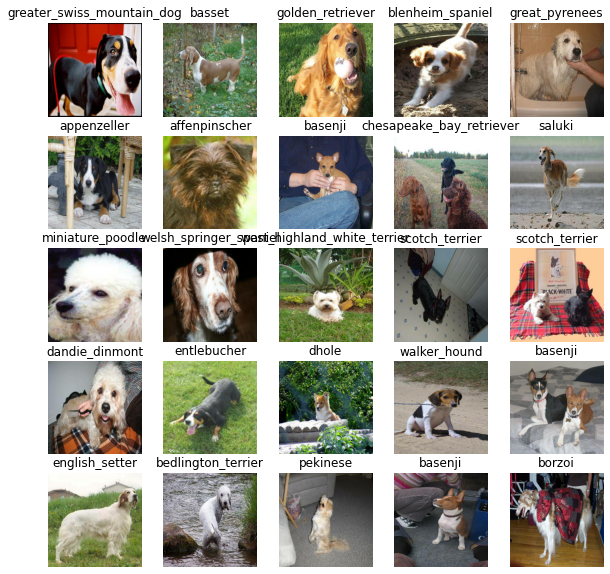

In [40]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

## Build a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensor) to our model.
* The output shape (images labels, in the form of Tensors) of our model.
* The URL of themodel we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5

In [41]:
# Setup unput shape to the model 
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # BATCH, height, widtg colour channels

# setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5"

Now we've got our inputs, outputs and model ready to go.
Let's put them together into a keras deep learning model!

Knowinig, let's create a function which:
* Takes the inpup shape, output shape and the model we've chosen as parameters.
* Defines the layers in keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All these steps can be found here:https://www.tensorflow.org/guide/keras/sequential_model

In [42]:
from tensorflow.python import metrics
# Create a function wich builds a keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # build the model
  model.build(INPUT_SHAPE)

  return model

In [43]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              6158505   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 6,278,745
Trainable params: 120,240
Non-trainable params: 6,158,505
_________________________________________________________________


## Creating callback

Callback are helper functions a model can use during training to do such things as sae its progress, check its progress or stip training early if a model stops improving.

We'll craete two callbacks, one for TensorBoard which helps track our models progress and anoteher early stopping wich prevents our model fro training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension ✅
2. Create a TesorBoard callback which is abole to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

In [44]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [45]:
import datetime

# Create a function to build a Tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/DogVision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [46]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [47]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [48]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESS!!!!)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use.
* Return the model


In [49]:
#  build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callback we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [50]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5
Epoch 1/100
25/25 [==============================] - 320s 12s/step - loss: 4.5480 - accuracy: 0.1025 - val_loss: 3.4972 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 4s 145ms/step - loss: 1.6233 - accuracy: 0.7025 - val_loss: 2.1731 - val_accuracy: 0.5550
Epoch 3/100
25/25 [==============================] - 3s 120ms/step - loss: 0.5459 - accuracy: 0.9513 - val_loss: 1.6206 - val_accuracy: 0.6600
Epoch 4/100
25/25 [==============================] - 3s 119ms/step - loss: 0.2400 - accuracy: 0.9925 - val_loss: 1.4311 - val_accuracy: 0.6700
Epoch 5/100
25/25 [==============================] - 3s 120ms/step - loss: 0.1421 - accuracy: 0.9975 - val_loss: 1.3495 - val_accuracy: 0.7100
Epoch 6/100
25/25 [==============================] - 3s 121ms/step - loss: 0.0976 - accuracy: 1.0000 - val_loss: 1.3014 - val_accuracy: 0.7050
Epoch 7/100
25/25 [==============================

**Question:** It looks like our model is overfitting because it's performing far better oon the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learing!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [51]:
%tensorboard --logdir drive/My\ Drive/DogVision/logs

Output hidden; open in https://colab.research.google.com to view.

### Making and Evaluating predictions using a trained model

In [52]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 92ms/step


array([[3.6912233e-02, 3.5206298e-03, 3.4263384e-04, ..., 1.0381055e-04,
        1.1796711e-04, 1.2060981e-03],
       [3.2279661e-04, 2.5477312e-03, 1.8145799e-03, ..., 2.4854126e-03,
        3.7435514e-03, 6.2507647e-04],
       [7.4625415e-05, 2.9278899e-04, 2.7685182e-05, ..., 4.0893597e-04,
        1.1928344e-05, 3.6696048e-05],
       ...,
       [2.2361315e-05, 1.8334539e-04, 3.1365725e-04, ..., 7.7733632e-05,
        1.3899029e-05, 1.2405083e-04],
       [5.2390579e-04, 1.0784351e-04, 1.2755240e-05, ..., 1.4503198e-04,
        2.4702153e-04, 2.2006072e-03],
       [2.7719277e-04, 9.9781784e-05, 9.7408966e-04, ..., 9.3449447e-03,
        2.1604570e-03, 6.0127728e-05]], dtype=float32)

In [53]:
np.sum(predictions[0])

0.99999994

In [54]:
predictions.shape

(200, 120)

In [55]:
len(y_val)

200

In [56]:
len(unique_breeds)

120

In [57]:
# First predictions
index = 0
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions)}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[3.69122326e-02 3.52062983e-03 3.42633837e-04 4.74359898e-04
 6.87428284e-04 3.00714019e-04 3.95501079e-03 9.79737495e-04
 7.82576681e-04 1.34221744e-04 5.18628024e-03 2.09668977e-03
 2.86814669e-04 4.28780440e-05 5.02388721e-05 1.15927440e-04
 2.64324499e-05 4.29382473e-02 1.49775718e-04 1.14424838e-05
 2.97054858e-03 2.76298914e-03 2.11722931e-04 4.26821527e-04
 4.52033200e-05 8.82804161e-04 2.50585794e-01 5.29950310e-04
 4.81325155e-03 1.04147906e-03 3.31111398e-04 3.13215074e-04
 4.35754017e-04 4.22704674e-04 2.27316632e-04 1.73672643e-02
 1.44583188e-04 1.86424688e-04 7.06959341e-04 1.11741960e-04
 7.59842398e-04 5.12639053e-05 2.15386928e-04 2.31438244e-04
 3.94347480e-05 4.90505015e-04 1.00048172e-04 8.39405227e-04
 3.37966275e-03 3.68129200e-04 2.07970574e-04 1.05330709e-03
 1.01245092e-02 3.97516793e-04 4.37394454e-04 5.07210025e-05
 7.98608118e-04 3.59149952e-03 8.15447202e-05 3.59494872e-02
 3.98552715e-04 9.37805453e-05 3.72452225e-04 1.13818474e-04
 3.53323790e-04 2.356714

In [58]:
unique_breeds[113]

'walker_hound'

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on.

**Note:** Prediction probabilities are also known as confidence levels.

In [59]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predictd label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'basenji'

In [60]:
val_data


<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still  in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth label).

In [61]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensor and returns separate arrays of images an labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [62]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [63]:
get_pred_label(val_labels[0])

'affenpinscher'

Now we've got wys to get:
* Prediction Label
* Validation labes (truth labels)
* Validation Images

Let's make some function to make these all a bit more visualize.

We'll create a function wich:
* Takes an array of prediction probabilities, an array of truth lables and an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot tge predicted label, its predicted probability, the truth label ad the target image on a single plot.

In [64]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

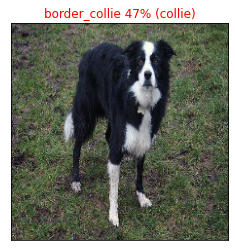

In [65]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=43)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:
* Take an input of precistion probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and lables, coloring the true label green

In [66]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

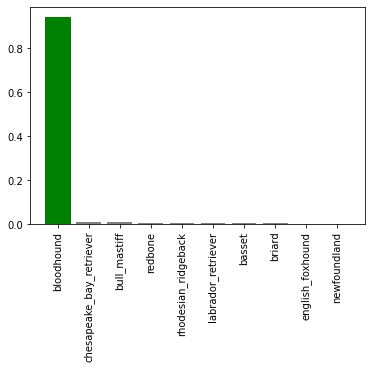

In [67]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=100)

Now we'got some function to help us visualize our predictions and evalute our model, let's check out a few.

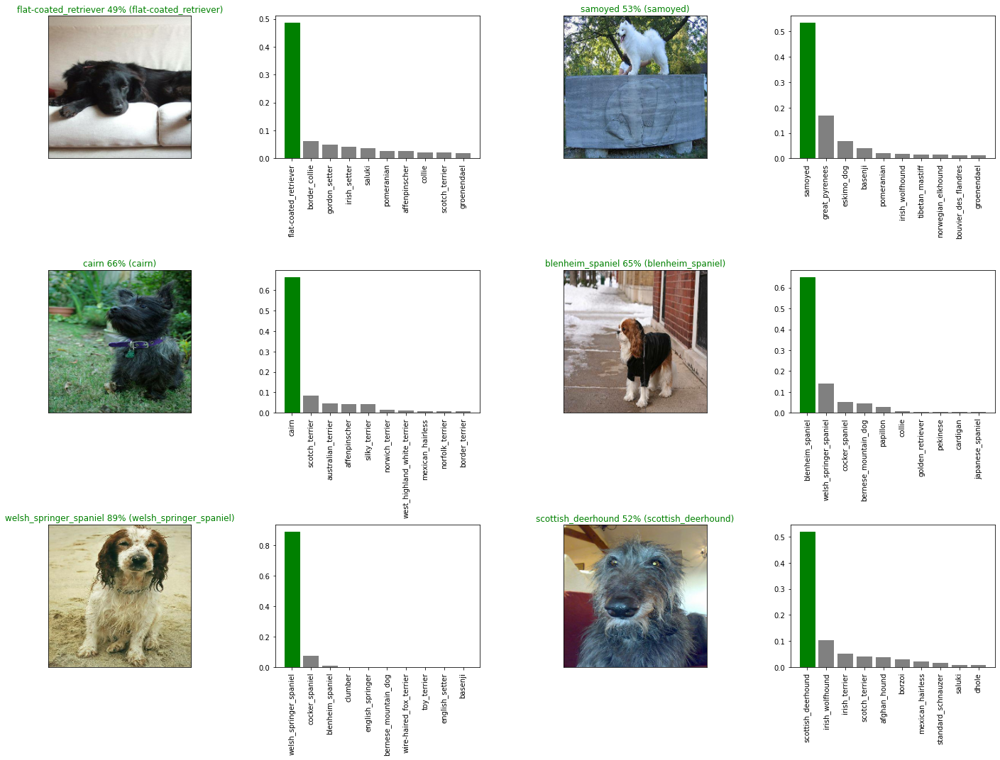

In [68]:
# Let's check a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge:** How would you create a cinfusion a=matrix with our models predictions and true labels?

## Saving and reloading a trained model

In [69]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/MyDrive/DogVision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [70]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got dunctions to save and load a trained model, let's make sure they work!

In [71]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/MyDrive/DogVision/models/20230131-21361675201016-1000-images-Adam.h5...


'drive/MyDrive/DogVision/models/20230131-21361675201016-1000-images-Adam.h5'

In [72]:
# Load our model trained on 1000 images
model_1000_images = load_model('drive/MyDrive/DogVision/models/20230129-22071675030061-1000-images-Adam.h5')

Loading saved model from: drive/MyDrive/DogVision/models/20230129-22071675030061-1000-images-Adam.h5


In [73]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 84ms/step - loss: 1.2460 - accuracy: 0.7100


[1.2459940910339355, 0.7099999785423279]

In [74]:
# Evaluate the loaded model
model_1000_images.evaluate(val_data)

7/7 [==============================] - 1s 86ms/step - loss: 1.2916 - accuracy: 0.7000


[1.291590929031372, 0.699999988079071]

## Training a model 🐶(on the full data)

Now we know our model works on a subset of the data, we can start to move forward with training one on the full data.

Above, we saved all of the training filepaths to X and all of the training labels to y. Let's check them out.

In [75]:
# Remind ourselves of the size of the full dataset
len(X), len(y)

(10222, 10222)

In [76]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [77]:
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5


In [78]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [79]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [80]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, 
                          full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 3302s 10s/step - loss: 1.2831 - accuracy: 0.6840
Epoch 2/100
320/320 [==============================] - 30s 93ms/step - loss: 0.3609 - accuracy: 0.8942
Epoch 3/100
320/320 [==============================] - 30s 94ms/step - loss: 0.2038 - accuracy: 0.9470
Epoch 4/100
320/320 [==============================] - 31s 96ms/step - loss: 0.1300 - accuracy: 0.9706
Epoch 5/100
320/320 [==============================] - 30s 94ms/step - loss: 0.0889 - accuracy: 0.9838
Epoch 6/100
320/320 [==============================] - 30s 94ms/step - loss: 0.0616 - accuracy: 0.9922
Epoch 7/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0476 - accuracy: 0.9939
Epoch 8/100
320/320 [==============================] - 31s 97ms/step - loss: 0.0379 - accuracy: 0.9964
Epoch 9/100
320/320 [==============================] - 29s 92ms/step - loss: 0.0310 - accuracy: 0.9970
Epoch 10/100
320/320 [==============================] - 30s 92ms/step - 

In [81]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/DogVision/models/20230131-22481675205335-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/DogVision/models/20230131-22481675205335-full-image-set-mobilenetv2-Adam.h5'

In [82]:
# Loading the full model
load_full_model = load_model("drive/MyDrive/DogVision/models/20230131-22481675205335-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/DogVision/models/20230131-22481675205335-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Sience our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier wich can take a list od filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model

In [85]:
# Load test image filenames
test_path = "drive/MyDrive/DogVision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/DogVision/test/e6295bd4afe5ddf93a02cbd668819e9e.jpg',
 'drive/MyDrive/DogVision/test/e145bbebb9ad1e740256e460899a6b67.jpg',
 'drive/MyDrive/DogVision/test/e40a39dd88f04b29ab3cb3a986503f8f.jpg',
 'drive/MyDrive/DogVision/test/e1ada9b155a5903bc6475255d012f681.jpg',
 'drive/MyDrive/DogVision/test/e137b0cd96051765c349377725c4696d.jpg',
 'drive/MyDrive/DogVision/test/e519e383a6efec0abd285beda04aeac9.jpg',
 'drive/MyDrive/DogVision/test/e7b357150635c250757363718e4dae86.jpg',
 'drive/MyDrive/DogVision/test/e411a1b3681604f6321af7cb8e8f2de7.jpg',
 'drive/MyDrive/DogVision/test/e061b8d24e7b1324a6ac92ae81fdda19.jpg',
 'drive/MyDrive/DogVision/test/e0f2620cb1ebf648b986c8a09dbd3664.jpg']

In [86]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [87]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** calling `predic()` on our full modell and passing it the test data batch will take a loong time to tun (about a ~1hr). This is because we have to process ~10,000+ images and hget our model to find patterns in those images and generate predictions based on what its learned in the training dataset.

In [88]:
# Make predictions on test data batch using the loaded model
test_predictions = load_full_model.predict(test_data,
                                           verbose=1)

324/324 [==============================] - 3752s 12s/step


In [95]:
# save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/DogVision/preds_arrays.csv", test_predictions, delimiter=",")

In [98]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/DogVision/preds_arrays.csv", delimiter=",")

In [99]:
test_predictions[:10]

array([[3.97623462e-11, 2.13314699e-09, 1.12006382e-09, ...,
        4.60485944e-06, 9.65993258e-11, 1.50941634e-10],
       [1.90540153e-08, 7.49140980e-08, 1.04659001e-08, ...,
        1.05323132e-10, 3.47441603e-10, 2.38163143e-08],
       [1.51280551e-06, 4.89940106e-08, 7.41089536e-08, ...,
        1.21382136e-05, 1.11975474e-07, 5.30841646e-07],
       ...,
       [8.35015896e-07, 1.08783552e-05, 1.09775165e-05, ...,
        4.54527297e-04, 1.28346770e-07, 1.10219830e-07],
       [2.20696328e-09, 7.16989291e-07, 3.84856982e-08, ...,
        1.28065452e-08, 3.86905157e-07, 1.30505340e-09],
       [3.77533031e-12, 1.07036970e-10, 6.60229510e-12, ...,
        9.05153008e-10, 7.90208936e-13, 2.57507817e-11]])

In [100]:
test_predictions.shape

(10357, 120)

### Preparing test dataset predictions for kaggle


Looking at the kaggle sample submission, we find that it wants our models prediction probability outouts in a DataFrame with an ID ad a column for each different dog breed.


https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a oandas DataFrame with an ID column as well as column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog bredd columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [104]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [108]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [109]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e6295bd4afe5ddf93a02cbd668819e9e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e145bbebb9ad1e740256e460899a6b67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e40a39dd88f04b29ab3cb3a986503f8f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e1ada9b155a5903bc6475255d012f681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e137b0cd96051765c349377725c4696d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [110]:
# Add the prediction probabilities to each dog bredd column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e6295bd4afe5ddf93a02cbd668819e9e,3.976235e-11,2.133147e-09,1.120064e-09,3.646751e-12,1.661821e-07,3.248831e-08,5.881896e-12,5.795708e-07,6.196269e-09,...,1.428655e-08,5.911755e-09,1.760003e-07,9.793498e-09,3.826625e-09,4.677841e-09,4.369281e-11,4.604859e-06,9.659933e-11,1.509416e-10
1,e145bbebb9ad1e740256e460899a6b67,1.905402e-08,7.491410e-08,1.046590e-08,2.522667e-09,4.168981e-10,3.398913e-10,5.611960e-09,1.586065e-10,1.863155e-09,...,2.236275e-07,1.767270e-09,1.107116e-07,5.086844e-10,2.030449e-08,1.267324e-07,1.067264e-10,1.053231e-10,3.474416e-10,2.381631e-08
2,e40a39dd88f04b29ab3cb3a986503f8f,1.512806e-06,4.899401e-08,7.410895e-08,1.209453e-07,1.391828e-03,1.150783e-06,1.768305e-09,3.696261e-07,1.419262e-05,...,2.546421e-07,7.077899e-07,1.636256e-04,6.317267e-05,1.255495e-06,7.446602e-08,1.816465e-09,1.213821e-05,1.119755e-07,5.308416e-07
3,e1ada9b155a5903bc6475255d012f681,5.000581e-06,7.886072e-07,1.424978e-08,6.497264e-05,1.276841e-05,5.555364e-11,4.166635e-06,2.975928e-06,1.475953e-06,...,2.880905e-06,6.626976e-08,1.804333e-06,1.675557e-04,1.258169e-07,3.708556e-07,5.087257e-09,1.005239e-05,6.753413e-04,1.572614e-05
4,e137b0cd96051765c349377725c4696d,2.446328e-07,1.103506e-07,1.245017e-07,7.309812e-07,3.135007e-09,1.074690e-07,2.784710e-06,5.010606e-07,5.575275e-07,...,2.924389e-09,2.103211e-07,1.861441e-07,1.756654e-05,3.318335e-08,2.473631e-07,1.755695e-08,7.382258e-07,3.843282e-07,8.301647e-07


In [111]:
# Save our predictions dataframe to CSV for submissio to Kaggle
preds_df.to_csv("drive/MyDrive/DogVision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepath of our own images.
* Turn the filepaths into data batches using `create_dat_batches()`. And sicne our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custim image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Convert the predicted labels to the custom images.

In [115]:
# Get custom image filepaths
custom_path = "drive/MyDrive/DogVision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [116]:
custom_image_paths

['drive/MyDrive/DogVision/my-dog-photos/download.jfif',
 'drive/MyDrive/DogVision/my-dog-photos/dog-puppy-on-garden-royalty-free-image-1586966191.jpg']

In [117]:
# Turn custom images into atch dataset
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [126]:
# Make predictions on the custom data
custom_preds = load_full_model.predict(custom_data)

1/1 [==============================] - 0s 46ms/step


In [127]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever', 'golden_retriever']

In [128]:
custom_preds.shape

(2, 120)

In [129]:
# Get custom images (our unbatchify() functions won't work since aren't labels...  maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

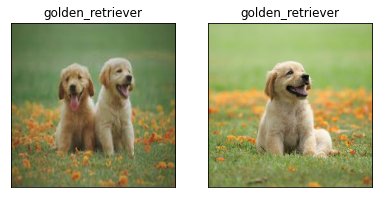

In [130]:
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)